# Исследование заведений общественного питания в г. Москве для инвесторов фонда «Shut Up and Take My Money»

Инвесторы из фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве. Заказчики определяют, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Наша задача - подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

## Импорт библиотек и изучение датафрейма

In [1]:
# импорт библиотек
import pandas as pd
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import seaborn as sns
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# сохраняем таблицу в переменную и выводим ее
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
# выводим общую информацию о таблице
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Видим, что:

1. названия столбцов в удобном виде;
2. есть пропуски;
3. типы данных во всех столбцах верные;
4. ниже проверим наличие дубликатов.

Приступаем к предобработке данных.

## Предобработка данных

### Дубликаты и пропуски

In [4]:
# проверяем наличие дубликатов

# меняем регистр столбца name
data['name'] = data['name'].str.lower()

# меняем регистр столбца address
data['address'] = data['address'].str.lower()

# применяем метод для поиска дубликатов вместе со срезом
data[data.duplicated(subset=['name', 'address'], keep=False)].sort_values(by='name')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Видим, что дубликаты в данных есть: всего 4 заведения являются полными дубликатами друг друга. Ниже избавимся от них.

In [5]:
data = data.drop_duplicates(subset=['name', 'address'], keep='first')

**По поводу пропусков:**

Я решил на данном этапе никак не заполнять пропуски, так как достоверно заполнить их у нас не получится. Все данные очень индивидуальны от заведения к заведению. Мы никак не сможем логически заменить пропуски, основываясь на информации из других столбцов. 

Я считаю, что внесение данных может исказить результаты исследования. Если ниже не выяснится, что отсутсвие данных сильно влияет на исследование (а оно, конечно, влияет, ведь пропуков очень много) будем думать, как их логически можно заполнить. Мы знаем, что эти данные носят справочный характер (из условий), поэтому и графики будут носить такой же характер.

### дубликаты в категориальных данных

In [6]:
# дубликаты в категориях заведений
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Видим, что всего у нас 8 категорий и среди них дубликатов нет.

In [7]:
# дубликаты в районах Москвы
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Всего у нас 9 районов и среди них дубликатов нет.

### Добавление новых столбцов

In [8]:
# добавляем столбец с названиями улиц
data['street'] = data['address'].str.split(',').str[1]

In [9]:
# добавляем столбец с обозначениями круглосуточной работы заведений
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

### выбросы и аномалии

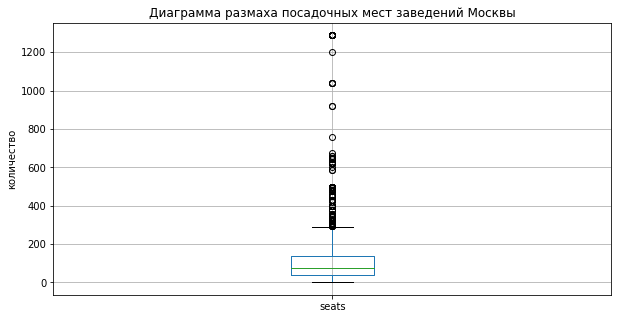

In [10]:
# посмотрим на размах количества посадочных мест по всем заведениям
plt.figure(figsize=(10, 5))
data.boxplot('seats')
plt.title('Диаграмма размаха посадочных мест заведений Москвы')
plt.ylabel('количество')
plt.show();

По графику видим, что выбросы есть, медианное значение количества посадочных мест во всех категориях около 150. Но есть заведения в которых более 1500 и 1000 посадочных мест! Интересно, что это за заведения, давайте посмотрим на них:

In [11]:
data[data['seats'] >= 1000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2713,ваня и гоги,"бар,паб","москва, измайловское шоссе, 71, корп. а",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750.0,NaN,0,1040.0,измайловское шоссе,False
2722,маргарита,быстрое питание,"москва, измайловское шоссе, 71, корп. а",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,NaN,NaN,NaN,NaN,1,1040.0,измайловское шоссе,False
2770,шоколадница,кофейня,"москва, измайловское шоссе, 71, корп. а",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,NaN,NaN,NaN,NaN,1,1040.0,измайловское шоссе,False
2966,матрешка,кафе,"москва, измайловское шоссе, 71, корп. а",Восточный административный округ,NaN,55.789867,37.749656,4.0,NaN,NaN,NaN,NaN,0,1040.0,измайловское шоссе,False
4231,рестобар argomento,столовая,"москва, кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,0,1200.0,кутузовский проспект,False
6518,delonixcafe,ресторан,"москва, проспект вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0,проспект вернадского,True
6524,ян примус,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0,проспект вернадского,False
6574,мюнгер,пиццерия,"москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0,проспект вернадского,False
6641,one price coffee,кофейня,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0,проспект вернадского,False
6658,гудбар,"бар,паб","москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0,проспект вернадского,False


Если посмотреть в интернете, что это за заведения, станет ясно, что это какая-то ошибка. Данные заведения не могут вмещать в себя более 1000 человек, да и по графику мы видим, что нормальное значение мест в заведении заканчивается около 350. Но в множестве заведений количество посадочных мест больше.

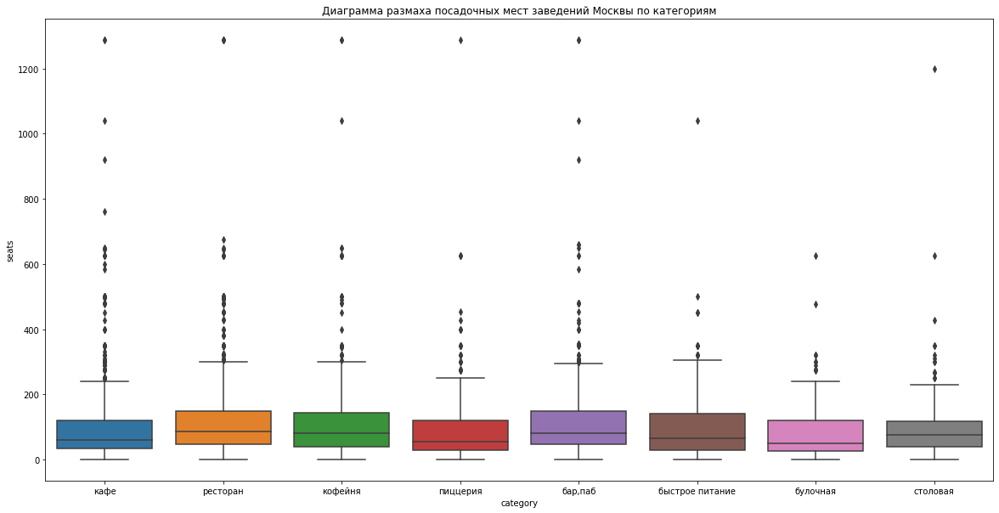

In [12]:
# строим боксплот с количеством посадочных мест по категориям
plt.figure(figsize=(20, 10))
plt.title('Диаграмма размаха посадочных мест заведений Москвы по категориям')
sns.boxplot(x=data['category'], y=data['seats'], data=data);

Видим, что аномалии есть во всех категориях. Но в целом, замечаем, что больше всего посадочных мест по медиане в ресторанах и барах.

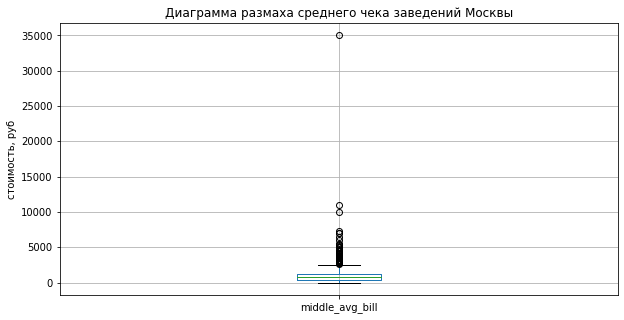

In [13]:
# посмотрим на размах среднего чека по всем заведениям
plt.figure(figsize=(10, 5))
data.boxplot('middle_avg_bill')
plt.title('Диаграмма размаха среднего чека заведений Москвы')
plt.ylabel('стоимость, руб')
plt.show();

По среднему чеку также явно видны аномалии, поставим лимит, но прежде посмотрим, что это за заведение.

In [14]:
data[data['middle_avg_bill'] > 30000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
7177,кафе,ресторан,"москва, каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.65745,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0,каширское шоссе,True


Очень странное заведение, похоже на какую-то ошибку.

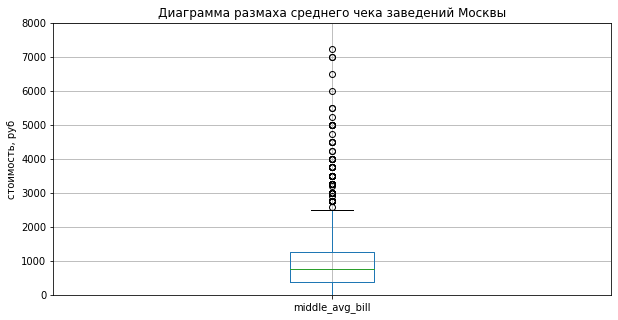

In [15]:
# поставим лимиты для более детального анализа
plt.figure(figsize=(10, 5))
data.boxplot('middle_avg_bill')
plt.title('Диаграмма размаха среднего чека заведений Москвы')
plt.ylabel('стоимость, руб')
plt.ylim(0, 8000)
plt.show();

Тут более менее все понятно, медиана среднего чека около 1000 рублей по Москве.

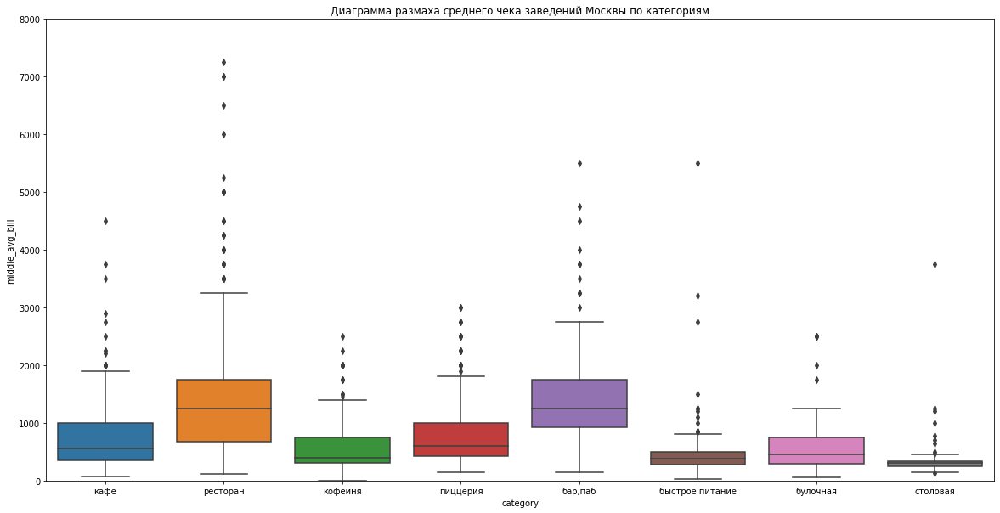

In [16]:
# строим боксплот с средним чеком по категориям
plt.figure(figsize=(20, 10))
sns.boxplot(x=data['category'], y=data['middle_avg_bill'], data=data)
plt.title('Диаграмма размаха среднего чека заведений Москвы по категориям')
plt.ylim(0, 8000);

Видим, что больше всего люди платят в ресторанах и барах. Выбросы есть во всех категориях.

### итог предобработки

In [17]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


**Предобработка данных завершена:**

1. В данных есть дубликаты, но они не влияют на исследование;
2. Дубликатов в категориальных данных нет;
3. Пропуски заполнить мы не можем;
4. Типы данных верные;
5. Названия столбцов корректные;
6. Добавлены столбцы, которые помогут в анализе;
7. В данных есть явные выбросы.

Переходим к анализу.

## Анализ данных

### исследование категорий

In [18]:
# выводим количество заведений по категориям
pivot_category = (data
                  .pivot_table(index='category', values='name', aggfunc='count')
                  .sort_values(by='name', ascending=False)
                  .rename(columns={'name' : 'quantity'})
                 )

pivot_category

,quantity
category,
кафе,2376
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


В Москве больше всего кафе и ресторанов (в общей сложности они составляют больше половины всех заведений) - я думаю, это объясняется популярностью таких заведений. 

Далее идут кофейни, их в Москве тоже много - на 2022 год 1413.

За ними идут заведения, которых на всю Москву не очень много бары и пабы, пиццерии, заведения быстрого питания, столовые и в конце списка - булочные.

Распределение, в целом, нормальное. Ниже визуализируем данные.

In [19]:
# визуализируем распределение
name_cat = pivot_category.index

values = pivot_category['quantity']

#строим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=name_cat, values=values)])
fig.update_layout(title='Соотношение категорий заведений в Москве')
fig.show() 

График подтверждает наши выводы выше. Больше всего в Москве кафе - 2378, ресторанов чуть мньше - 2043. Две эти категории составляют более 50% от общего числа заведений в Москве! Это самые популярные катеогрии заведений. Замыкает тройку кофейни с приличным отставанием - их в Москве 1413. Далее идут заведения, которых в Москве не очень много, но я думаю от этого они не становятся не популярными:
бары и пабы - 765,
пиццерии - 633,
рестораны быстрого питания - 603,
столовые - 315,
булочные - 256.

Вот такое распределение заведений получается в Москве.

### исследование количества посадочных мест

In [20]:
# выводим медианное количество посадочных мест по категориям
pivot_seats = (data
               .pivot_table(index='category', values='seats', aggfunc='median')
               .sort_values(by='seats', ascending=False)
               .rename(columns={'seats' : 'median_quantity'})
              )

pivot_seats

,median_quantity
category,
ресторан,86.0
"бар,паб",82.0
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


Расчитываем медиану, так как она более устойчива к выбросам и покажет более реальную картину.

В ресторанах Москвы обычно 86 мест, в барах чуть меньше, удивительно, что в кофейнях больше посадочных мест по медиане, чем в кафе. 

Визуализируем выводы.

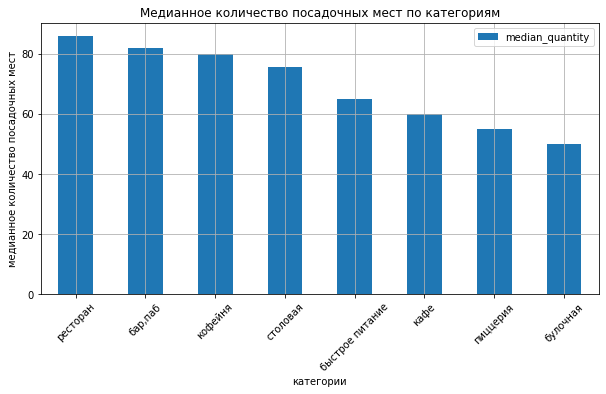

In [21]:
# визуализируем распределение

pivot_seats.plot(
    title='Медианное количество посадочных мест по категориям',
    rot=45,
    kind='bar',
    figsize=(10, 5),
    grid=True,
    xlabel='категории',
    ylabel='медианное количество посадочных мест'
);

Наши выводы подтверждаются графиком: рестораны, бары и кофейни в медиане имеют бóльшее количество мест, чем все остальные заведения Москвы.

### соотношение сетевых и несетевых заведений

In [22]:
# считаем отношение сетевых к несетевым
chains = data['chain'].mean()

# находим отношение несетевых к сетевым
not_chains = 1 - chains

#сохраняем в переменные
name = ['сетевое', 'несетевое']
chain_or_not = [chains, not_chains]

#строим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=name, values=chain_or_not)])
fig.update_layout(title='Соотношение сетевых и несетевых заведений в Москве')  
fig.show() 

Видим, что основная часть заведений Москвы - это несетевые места (их почти 62% в цифрах - 5201), то есть конкретные точки определенных заведений. Сетевых заведений 38% - это 3205 от общего числа. Получается, что в Москве больше несетевых заведений, причем в 1.5 раза больше - это сильное опережение.

### сетевые заведения по категориям

In [23]:
# составляем сводную таблицу с сетями в разных категориях
pivot_chains = (data
                .pivot_table(index='category', values='chain', aggfunc='sum')
                .sort_values(by='chain', ascending=False)
                .rename(columns={'chain' : 'chain_quantity'})
               )

pivot_chains['%'] = round(pivot_chains['chain_quantity'] / data.groupby('category')['name'].count() * 100, 2)
 
pivot_chains = pivot_chains.sort_values(by='%', ascending=False)
pivot_chains

,chain_quantity,%
category,,
булочная,157,61.33
пиццерия,330,52.13
кофейня,720,50.96
быстрое питание,232,38.47
ресторан,729,35.70
кафе,779,32.79
столовая,88,27.94
"бар,паб",168,21.99


Тройка лидеров неизменна. Больше всего сетей в категории кафе - 779, далле идут сетевые рестораны их - 730 и совсем недалеко ушли кофейни их - 720. Опять же кафе и рестораны занимают почти половину всех сетей (47%). Мы уже можем с уверенностью сказать, что кафе и ресторанов в Москве очень много, они очень популярны, но для окончательных выводов нам нужно еще немного исследований, например распределение по районам и тд. Займемся этим дальше.

Также мы вывели процентное соотношение сетевых заведений к несетевым внутри категорий, здесь есть очень интересные моменты. Больше всего соотношение сетевых заведений к несетевым в категории булочных, далее пиццерии и кофейни. 

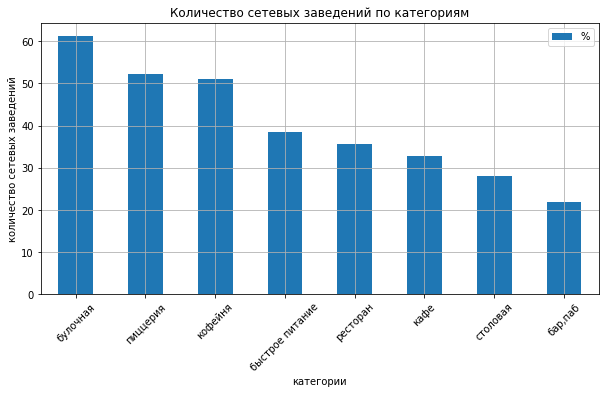

In [24]:
# визуализируем данные
pivot_chains.plot(
    y='%',
    title='Количество сетевых заведений по категориям',
    rot=45,
    kind='bar',
    figsize=(10, 5),
    grid=True,
    xlabel='категории',
    ylabel='количество сетевых заведений'
);

График получился очень наглядный: больше 60% булочных Москвы - это сетевые заведения. Достаточно высокое отношение сетевых/несетевых заведений также в категориях пиццерий и кофеен. Самая несетевая категория - бары и пабы.

### топ-15 популярных сетей в Москве

In [25]:
# выделяем из датасета сетевые заведения
chain_places = data[data['chain'] == 1]

# сводная таблица сетевых заведений МСК
count_category = pd.DataFrame(chain_places
                              .groupby('name')
                              .count()
                              .sort_values(by='category', ascending=False)
                              .head(15)['category']
                             )
count_category.columns= ['quantity']

count_category

,quantity
name,
шоколадница,120
домино'с пицца,76
додо пицца,74
one price coffee,71
яндекс лавка,69
cofix,65
prime,50
хинкальная,44
кофепорт,42


Как мы видим ТОП 3 сетей в Москве занимают Шоколадница,  Домино'с Пицца и Додо пицца - то есть сеть кофеен и две сетевые пиццерии. Визуализируем данные для более удобного восприятия.

In [26]:
# переменные для круговой диаграммы
name_cat = count_category.index
values = count_category['quantity']

# строим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=name_cat, values=values, pull=[0.2, 0.1, 0.05])])
fig.update_layout(title='Топ-15 сетевых заведений')          
fig.show()

Конкурировать с сетевыми пиццериями явно нет смысла. В целом визуализация подтверждает наши выводы выше. Давайте посмотрим, какие категории занимают ТОП 15 в Москве

In [27]:
# создаем список с названиями ТОП 15 заведений МСК
names = ['шоколадница', "домино'с пицца", 
         'додо пицца', 'one price coffee', 
         'яндекс лавка', 'cofix', 'prime', 
         'хинкальная', 'кофепорт', 
         'кулинарная лавка братьев караваевых', 
         'теремок', 'чайхана', 'cofefest', 
         'буханка', 'му-му'
        ]

# делаем срез и схраняем в переменную, группируем и выводим
data_1 = data.query('name == @names and chain == 1')
data_1.groupby('category')['name'].count().sort_values(ascending=False)

category
кофейня            336
ресторан           186
пиццерия           151
кафе               100
булочная            25
быстрое питание     12
бар,паб              4
столовая             2
Name: name, dtype: int64

Видим, что в основном это заведения кофейни, рестораны и пиццерии, кафе отстают. А столовые и пабы в самом низу списка в ТОП 15 популярных сетей входит всего 4 бара и 2 столовых.

### заведения по административным районам Москвы

In [28]:
# сводная таблица с общим числом заведений в районе
pivot_districts = (data
                   .pivot_table(index='district', values='name', aggfunc='count')
                   .sort_values(by='name', ascending=False)
                   .rename(columns={'name' : 'total_in_dist'})
                  )

pivot_districts

,total_in_dist
district,
Центральный административный округ,2242
Северный административный округ,898
Южный административный округ,892
Северо-Восточный административный округ,890
Западный административный округ,850
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


В данной таблице предсталвено общее количество заведений в районах Москвы. Видим, что в ЦАО больше всего заведений, сильно больше, чем в остальных районах. Это объясняется большим спросом в центре города из-за туристов и офисов. Остальные районы сильно отстают от центра.

Давайте ниже выведем визуализацию количества заведений города по категориям в районах Москвы.

In [29]:
# строим сводную таблицу с категориями и количеством заведений по районам Москвы
dist = data.pivot_table(index='district', values='name', columns='category', aggfunc='count')

# визуализируем количество заведений по категориям по районам МСК
fig = px.histogram(dist, 
                   x=['Восточный административный округ', 
                      'Западный административный округ', 
                      'Северный административный округ', 
                      'Северо-Восточный административный округ', 
                      'Северо-Западный административный округ', 
                      'Центральный административный округ', 
                      'Юго-Восточный административный округ', 
                      'Юго-Западный административный округ', 
                      'Южный административный округ'], 
                   y=['бар,паб',
                      'булочная', 
                      'быстрое питание', 
                      'кафе', 'кофейня', 
                      'пиццерия', 
                      'ресторан', 
                      'столовая'],
                   title='Количество заведений по категориям по округам Москвы'
                  ).update_xaxes(categoryorder='total descending')

fig.update_layout(yaxis_title='количество')
fig.update_layout(xaxis_title='округа')
fig.show()

Видим распределение и количество заведений разных категорий по районам Москвы. Как мы и писали выше: ЦАО сильно выделяется из общего списка. Там очень много ресторанов - почти 700, и всех остальных заведений там явно больше. Спрос рождает предложение!

Во всех остальных районах больше кафе, рестаранов чуть меньше. Самый бедный по заведениям район - это Северо-Западный, там очень мало заведений (всего 409).

### распределение средних рейтингов по категориям заведений

In [30]:
# средние рейтинги по категориям
rating_pivot = (data
                .groupby('category')['rating']
                .mean()
                .sort_values(ascending=False)
               )
rating_pivot

category
бар,паб            4.387696
пиццерия           4.301264
ресторан           4.290402
кофейня            4.277282
булочная           4.268359
столовая           4.211429
кафе               4.124285
быстрое питание    4.050249
Name: rating, dtype: float64

Как мы видим, цифры в разынх категориях достаточно близки. Визуализируем данные, чтобы легче воспринимать информацию.

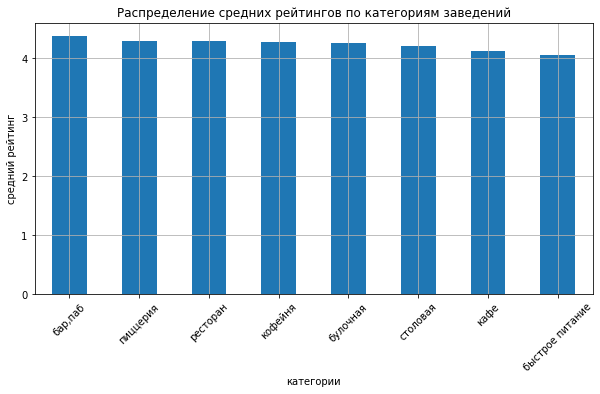

In [31]:
# визуализируем данные
rating_pivot.plot(
    title='Распределение средних рейтингов по категориям заведений',
    rot=45,
    kind='bar',
    figsize=(10, 5),
    grid=True,
    xlabel='категории',
    ylabel='средний рейтинг'
);

Во всех категориях средний рейтинг выше 4, но десятые отличаются не сильно. Сказать, что существует значительная разница в средних рейтингах по категориям мы не можем. Давайте установим лимит, чтобы более детально рассмотреть ситуацию:

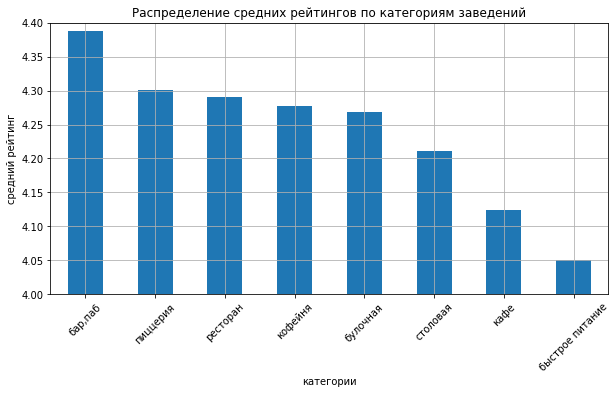

In [32]:
# визуализируем данные с установленным лимитом
rating_pivot.plot(
    title='Распределение средних рейтингов по категориям заведений',
    rot=45,
    kind='bar',
    figsize=(10, 5),
    grid=True,
    xlabel='категории',
    ylabel='средний рейтинг',
    ylim=(4, 4.4)
);

Так уже проще рассмотреть разницу. Самый низкий рейтинг у заведений быстрого питания, потом идут кафе, столовые, булочные, кофейни, рестораны, пиццерии. А самый высокий средний рейтинг имеют бары почти 4.4 из 5 - это хорошие цифры.

### фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [33]:
# создаем таблицу со средним рейтингом заведений по районам Москвы
rating_dist = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_dist

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.240980
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [34]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам Москвы',
).add_to(m)

# выводим карту
m

Отлично выидны различия по районам. Хоть и разница в средних оценках не велика, хороплет помогает отчетливо разделить оценки по районам Москвы. Мы видим, что высшие оценки у заведений в центре Москвы - это логично, именно в центре находятся, самые именитые заведения Москвы + у заведений в центре выше плотность, тк центр популярен среди туристов и работников. 

Низшие оценки у заведений в юго-восточном округе - видимо сказывается специфика района (полуиндустриальный полуспальный район).

### все заведения Москвы на карте

In [35]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Удобно, когда карта интерактивная и можно выделить конкретные заведения из общего массива. Эта карта наталкивает на мысль: а какие улицы самые ресторанные в Москве? Давайте изучим этот вопрос.

### топ-15 улиц Москвы по количеству заведений

In [36]:
# таблица с количеством заведений на каждой улице
top15_street = data.groupby('street')['name'].count().sort_values(ascending=False).head(15)

top_st = top15_street.index

top15_street

street
 проспект мира             183
 профсоюзная улица         122
 проспект вернадского      108
 ленинский проспект        107
 ленинградский проспект     95
 дмитровское шоссе          88
 каширское шоссе            77
 варшавское шоссе           76
 ленинградское шоссе        70
 мкад                       65
 люблинская улица           60
 улица вавилова             55
 кутузовский проспект       54
 улица миклухо-маклая       49
 пятницкая улица            48
Name: name, dtype: int64

Больше всего заведений на Проспекте Мира - это одна из популярнейших улиц в Москве, там много офисов, отелей и достопримечательностей рядом, а также она окружает весь центр Москвы.

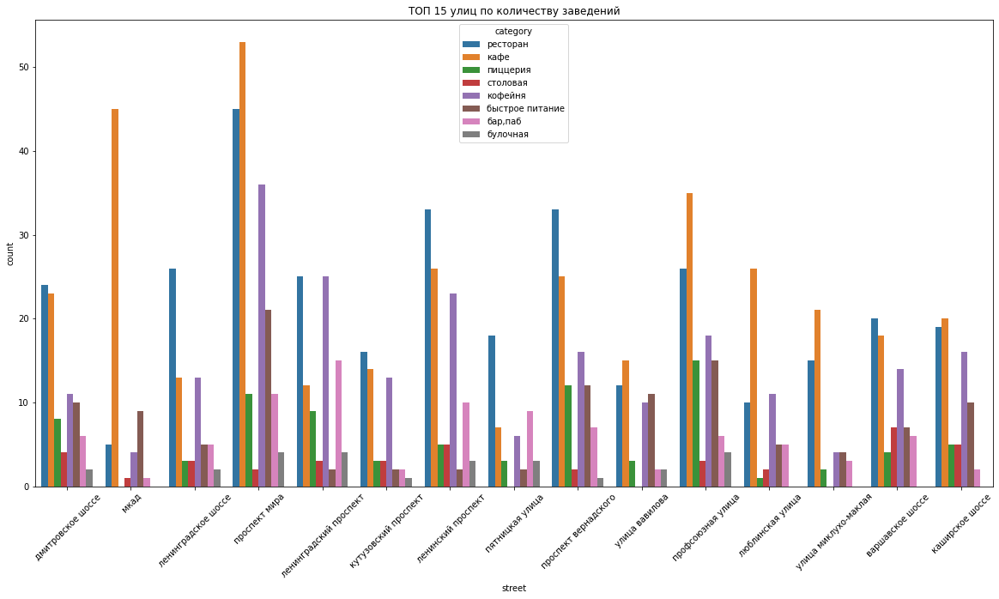

In [37]:
# визуализация 
top15_street = data.query('street in @top_st')
plt.figure(figsize=(20, 10))
sns.countplot(x='street', hue='category', data=top15_street)
plt.xticks(rotation=45)
plt.title('ТОП 15 улиц по количеству заведений')
plt.show()

Как мы и писали выще - на Проспекте Мира очень много заведений почти всех видов. Очень мало столовых. Что интересно вдоль МКАД очень много кафе и ресторанов быстрого питания, а вот остальных заведений крайне мало - специфика улицы.

### исследование улиц с 1 заведением

In [38]:
# количество улиц с 1 заведением
only_one = (data
            .pivot_table(index='street', values='name', aggfunc='count')
            .sort_values(by='name')
           )
only_one.columns = ['count']

only_one = only_one[only_one['count'] == 1]

print('Всего', only_one.shape[0], 'таких улиц.')

Всего 457 таких улиц.


In [39]:
# создадим список таких улиц
one_count_st = only_one.index
# создадим датафрейм с этими улицами
only_one_data = data.query('street in @one_count_st')

Перейдем к поиску закономерностей.

In [40]:
# напишем удобную функцию для построения хитмэпа
def heatmap(data, index, columns, values, aggfunc, title):
    data = data.pivot_table(index=index, columns=columns, values=values, aggfunc=aggfunc)
    plt.figure(figsize=(10,5))
    plt.title(title)
    sns.heatmap(data, annot=True)
    plt.show()

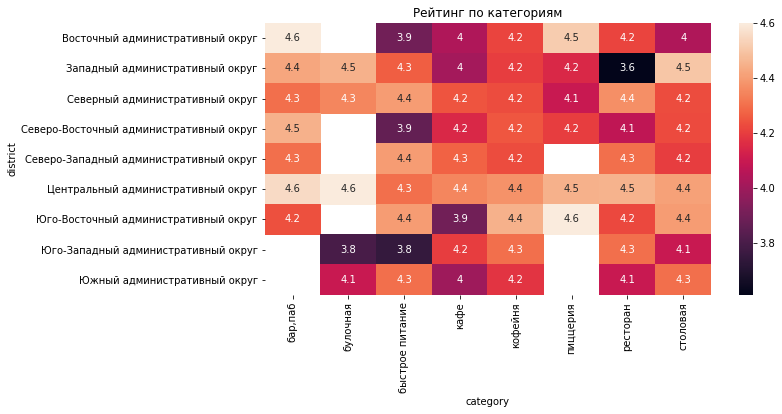

In [41]:
# строим хитмэп рейтингов по категориям в районах МСК
heatmap(only_one_data, 'district', 'category', 'rating', 'mean', 'Рейтинг по категориям')

Видим, что рейтинги в некоторых районах отсутсвуют, а порой достигают достаточно высоких цифр (может из-за отсутствия выбора). 

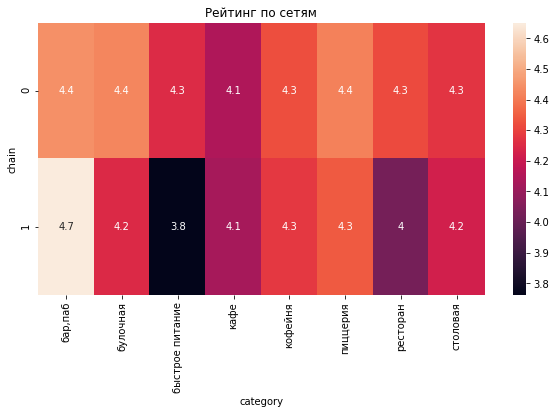

In [42]:
# хитмэп по категориям и сетевым/несетевым заведениям
heatmap(only_one_data, 'chain', 'category', 'rating', 'mean', 'Рейтинг по сетям')

Видим, что у сетевых баров достаточно высокие рейтинги - сеть помогает поддерживать уровень качества в разных заведениях - конкурировать с такими будет очень сложно.

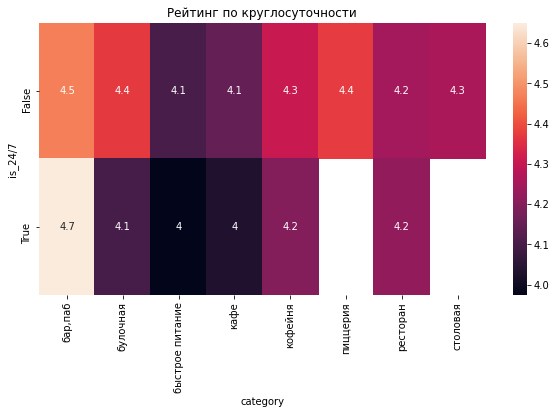

In [43]:
# хитмэп с рейтингом заведений по категориям и круглосуточности
heatmap(only_one_data, 'is_24/7', 'category', 'rating', 'mean', 'Рейтинг по круглосуточности')

Пиццерии и столовые не работают ночью? Главное, что работают бары -  у них очень высокий рейтинг, особенно у тех, которые работают 24/7.

### медиана средних чеков заведений по районам Москвы

In [44]:
# создаем таблицу со медианными средними чеками по районам Москвы
median_avg_bill_dist = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
median_avg_bill_dist

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [45]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill_dist,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по районам Москвы',
).add_to(m)

# выводим карту
m

Видим, что медианный средний чек выше в центре и западных районах Москвы. Есть определенная взаимосвязь: центр и запад Москвы - это очень дорогие и элитные районы Москвы (именно в этих направлениях находятся Барвиха, Рублевка и тд). Цены выше, потому что больше элитных заведений, тк большая часть элиты сосредоточена в этих районах. Мы видим это и по цифрам и по хороплету.

### Вывод к главе:

1. Больше всего в Москве кафе, ресторанов и кофеен;
2. Самый популярный район – Центральный;
3. В Москве нет улиц, которые бы отличались количеством определённых мест;
4. Больше всего посадочных мест нужно чтобы открыть ресторан или бар. Меньше всего мест нужно для булочных;
5. По категориями средний рейтинг не сильно отличается, однако у быстрого питания они ниже всего, а у баров выше всего;
6. Большая часть заведений – несетевые, 38,1% круглосуточные;
7. Самая сетевая категория - булочные (61%) - самая несетевая - бары и пабы (22%);
8. Большая часть заведений – некруглосуточные;
9. Самыми популярными в Москве являются заведения: Шоколадница, Домино'с пицца и Додо Пицца;
10. По всем данным больше всего кафе, ресторанов и кофеен. Пиццерии вероятнее всего являются олигополией, поэтому конкурировать с ними будет сложно;
11. В центральном районе очень много ресторанов. В остальные районах больше предпочитают кафе, но ресторанов также много;
12. Самые высокие рейтинги в Центральном районе, самые низкие в Юго-Восточном;
13. Самой большой по количеству заведений является улица проект Мира. На ней, как и на многих других улицах больше всего кафе. Также на многих улицах большое количестве ресторанов;
14. На 458 улицах находится только 1 заведение. На этих улицах, у некруглосуточных заведений рейтинг примерно одинаковый, а у круглосуточных самый высокий у баров, пиццерий и столовых. У сетевых заведений высокий рейтинг у баров. Рейтинги относительно общих данных достаточно высокие. Особенно выделяются булочные, пиццерии и бары;
15. Самые высокие цены не только в центральном районе. Также высокие цены в западном и юго-западных районах. Однако в остальных случаях цены ниже, чем в центральном районе;

## Детализируем исследование: открытие кофейни

В данной главе мы уделим внимание исследованию кофеен, находящихся в датасете. Основателям фонда хочется попробовать открыть кофейню в Москве. 

Попробуем определить, осуществимо ли это.

### количество, районы и особенности расположения кофеен в Москве

In [46]:
# строим датасет с кофейнями Москвы
data_coffee = data[data['category'] == 'кофейня'].reset_index(drop=True)
data_coffee.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
1,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
2,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
3,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
4,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False


In [47]:
print('Количество кофеен в Москве равно:', data_coffee['name'].count())
print()
print('Это', 
      round(data_coffee['name'].count() / data['name'].count() * 100), 
      '% от общего числа (', 
      data['name'].count(), 
      ')'
     )

Количество кофеен в Москве равно: 1413

Это 17 % от общего числа ( 8402 )


В цифрах это выглядит так, как будто кофеен не очень много, всего 17% от всех заведений. Давайте выведем кофейни на карту и посмотрим на их плотность и расположение.

In [48]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
data_coffee.apply(create_marker, axis=1)
    
# выводим карту
m

Так выглядит убидительнее - кофеен в москве очень много! Если детальнее рассмотреть карту, то можно заметить, что в основном кофейни располагаются рядом с метро, станциями авто и жд транспорта и в торговых и бизнес центрах. В этом есть логика - люди перед работой частенько заходят за кофе и им очень удобно, когда кофейня находится либо рядом с их офисом, либо у выхода из метро/электрички/автобуса.

Посмотрим как кофейни распределяются по районам.

In [49]:
# создаем датасет с количеством кофеен по районам Москвы
coffee_dist = data_coffee.groupby('district', as_index=False)['name'].agg('count')
coffee_dist

,district,name
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


In [50]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_dist,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

По данному хороплету мы видим, что больше всего кофеен располагается в центральном районе - там находятся офисы и много туристов. Далее идет Северный АО: там 193 кофени, что кратно меньше чем в ЦАО. В остальных районах кофеен еще меньше - это объясняется тем, что эти райны являются спальными: там нет офисов, большого количества отелей и достопримечательностей, а значит и не будет целевой аудитории. В этих районах кофейни находятся в основном у станций, чтобы работники по пути могли купить кофе. Меньше всего кофеен в СЗАО - всего 62.

### круглосуточные кофейни

In [51]:
print('Всего в Москве', 
      data_coffee[data_coffee['is_24/7'] == True]['name'].count(), 
      'круглосуточных кофеен - это равняется:', 
      round(data_coffee[data_coffee['is_24/7'] == True]['name'].count() / data_coffee['is_24/7'].count() * 100, 2), 
      '% от общего числа кофеен в Москве.'
     )

Всего в Москве 59 круглосуточных кофеен - это равняется: 4.18 % от общего числа кофеен в Москве.


Интересно, что это за заведения и где они располагаются. Посмотрим на карту!

In [52]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# применяем функцию для создания маркера ко всем строкам датафрейма
data_coffee[data_coffee['is_24/7'] == True].apply(create_marker, axis=1)
    
# выводим карту
m

В основном круглосуточные кофейни находятся в ЦАО рядом со станциями метро/ЖД. Интересно посмотреть в цифрах, что это за заведения.

In [53]:
# круглосуточные кофейни по наименованиям
(data_coffee[data_coffee['is_24/7'] == True]
 .groupby('name')['address']
 .count()
 .sort_values(ascending=False)
 .head(10)
)

name
шоколадница       17
кофемания          8
wild bean cafe     6
wild bean          5
кофе хауз          3
кофе с собой       2
you&coffee         2
cofix              2
столица            1
пирог хауз         1
Name: address, dtype: int64

Как мы видим, почти все круглосуточные кофейни принадлежат большим сетям!

### рейтинги кофеен и их распределение по районам Москвы

In [54]:
# создаем датасет со средним рейтингом кофеен по районам Москвы
coffee_rating_dist = data_coffee.groupby('district', as_index=False)['rating'].agg('mean')
coffee_rating_dist

,district,rating
0,Восточный административный округ,4.282857
1,Западный административный округ,4.195333
2,Северный административный округ,4.291710
3,Северо-Восточный административный округ,4.216981
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449
6,Юго-Восточный административный округ,4.225843
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824


По цифрам видим, что рейтинги кофеен очень близки независимо от района. Выведем на карту.

In [55]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

Опять же либирует ЦАО - в нем рейтинг кофеен самый высокий, за ним идет СВАО - они очень близки по среднему рейтингу. У всех остальных районов рейтинги ниже, но незначительно.

### стоимость чашки капучино

In [56]:
print('Медианная стоимость чашки капучино в Москве равняется:', 
      round(data_coffee['middle_coffee_cup'].median()), 
      'рублей.')
print()
print('Средняя стоимость чашки капучино в Москве равняется:', 
      round(data_coffee['middle_coffee_cup'].mean()), 
      'рублей.')
print()
print('Минимальная стоимость чашки капучино в Москве равняется:', 
      round(data_coffee['middle_coffee_cup'].min()), 
      'рублей.')
print()
print('Максимальная стоимость чашки капучино в Москве равняется:', 
      round(data_coffee['middle_coffee_cup'].max()), 
      'рублей.')

Медианная стоимость чашки капучино в Москве равняется: 170 рублей.

Средняя стоимость чашки капучино в Москве равняется: 175 рублей.

Минимальная стоимость чашки капучино в Москве равняется: 60 рублей.

Максимальная стоимость чашки капучино в Москве равняется: 1568 рублей.


При открытии кофейни и выборе ценовой политики в Москве предлагаю ориентироваться на медианную стоимость чашки капучино, которая равняется 170 рублям. Это достаточно логично, так как мы выбираем самую популярную стоимость чашки капучино в Москве. 

Первое время также можно использовать политику больших компаний со специальным занижением цен и работой в убыток первое время, но считаю, что данный вариант не очень подходит в наших условиях.

In [57]:
# посмотрим на среднюю стоимость чашки капучино по районам

# создаем датасет со средней стоимость чашки капучино по районам Москвы
coffee_cap_dist = data_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean')

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cap_dist,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино по районам Москвы',
).add_to(m)

# выводим карту
m

По хороплету мы видим, что в ЦАО, ЗАО и ЮЗАО средняя стоимость чашки капучино равняется примерно 190 рублям. Это выше, чем в дургих районах (объясняется это скорее всего дорогой арендой в этих районах и их большой популярностью среди туристов и офисов).

### Вывод к главе:

Мы выяснили, что:

1. в Москве 1413 кофеен, что равняется 17% от общего числа заведений;
2. основная часть кофеен располагается в ЦАО рядом с метро, ЖД/авто вокзалами, офисами и ТЦ;
3. из общего числа кофеен в Москве всего 59 работают круглосуточно и почти все принадлежат сетям;
4. рейтинги кофеен во всех районах почти равны, но самые высокие в ЦАО;
5. минимальная стоимость чашки капучино в Москве - 60 рублей, максимальная - 1568, медианная - 170, средняя - 175;
6. самая высокая средняя стоимость чашки капучино в Москве в Центральном, Западном и Юго-Западном районах.

**Из всего вышесказанного мы можем сделать вывод, что:**

В 2022-2023 году открыть кофейню в Москве можно, тем более люди любят пробовать новое и скорее всего хотя бы раз зайдут, сложно будет их удержать, ведь выбор большой, а у многих уже есть любимые места, надо придумать фишку, которая будет цеплять. В целом, я бы посоветовал: 

1. открывать кофейню рядом с офисами или станциями метро/ЖД; 
2. обратить внимание на спальные районы (люди часто пьют кофе по пути на работу, а значит, выходя из дома, могут зайти за кофе);
3. не открывать круглосуточную кофейню, только если это не фишка заведения;
4. взять медианную стоимость чашки капучино за основу - 170 рублей или работать первое время в убыток.

## Презентация

Презентация: <https://drive.google.com/drive/folders/1oFt47zsVnTwI1TqdpUkkR2mhrtHwl4bF?usp=sharing> 

## Общий вывод

**В ходе данной работы были проделаны следующие шаги:**

    изучена сткрутура данных;

    проверено наличие дубликатов;

    изучены пропуски. Выяснено, что их заполнение будет затруднительным;

    проведён анализ данных всех категорий заведений;

    изучены данные о кофейнях;

    сделан отчёт в виде презентации.

**Найденные закономерности и рекомендации:**

1. самые популярные виды заведений: кафе, ресторан и кофейни. Видимо, они пользуются наибольшим спросом. Поэтому открытие кофейни - отличная идея;
2. вероятнее всего пиццерии образуют олигополию, из-за которой будет трудно с ними конкурировать;
3. в Москве нет улицы, которая бы отличалась определённым видом заведений. Однако, самая популярная улица - Проект Мира;
4. лучше всего открывать кофейню в Центральном районе, так как там больше всего заведений (при условии, что заказчик не боится конкуренции);
5. открывать кофейню в Западном районе не стоит, так как много усложняющих условий (размер, запросы);
6. стоит ориентироваться на количество мест от 65;
7. цена на капучино должна быть равна примерно 170 рублей;
8. в круглосуточной кофейне нет смысла.